In [9]:

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torch.utils.tensorboard import SummaryWriter  # to print to tensorboard


class Discriminator(nn.Module):
    def __init__(self, in_features):
        super().__init__()
        self.disc = nn.Sequential(
            nn.Linear(in_features, 128),
            nn.LeakyReLU(0.01),
            nn.Linear(128, 1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.disc(x)


class Generator(nn.Module):
    def __init__(self, z_dim, img_dim):
        super().__init__()
        self.gen = nn.Sequential(
            nn.Linear(z_dim, 256),
            nn.LeakyReLU(0.01),
            nn.Linear(256, img_dim),
            nn.Tanh(),  # normalize inputs to [-1, 1] so make outputs [-1, 1]
        )

    def forward(self, x):
        return self.gen(x)
'''
n summary, the discriminator takes input data (real or generated) and classifies it as real or fake,
while the generator takes random noise as input and generates fake data to try to fool the discriminator.
These networks are trained simultaneously in a GAN framework.
'''

# Hyperparameters etc.
device = "cuda" if torch.cuda.is_available() else "cpu"
lr = 3e-4
z_dim = 64
image_dim = 28 * 28 * 1  # 784
batch_size = 32
num_epochs = 150

disc = Discriminator(image_dim).to(device)
gen = Generator(z_dim, image_dim).to(device)
fixed_noise = torch.randn((batch_size, z_dim)).to(device)
transforms = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,)),
    ]
)

dataset = datasets.MNIST(root="dataset/", transform=transforms, download=True)
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
opt_disc = optim.Adam(disc.parameters(), lr=lr)
opt_gen = optim.Adam(gen.parameters(), lr=lr)
criterion = nn.BCELoss()
writer_fake = SummaryWriter(f"logs/fake")
writer_real = SummaryWriter(f"logs/real")
step = 0



import os
import torchvision.utils as vutils

# Directory to save generated images
output_dir = "generated_images"
os.makedirs(output_dir, exist_ok=True)


for epoch in range(num_epochs):
    for batch_idx, (real, _) in enumerate(loader):
        real = real.view(-1, 784).to(device)
        batch_size = real.shape[0]

        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        noise = torch.randn(batch_size, z_dim).to(device)
        fake = gen(noise)
        disc_real = disc(real).view(-1)
        lossD_real = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake = disc(fake).view(-1)
        lossD_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        lossD = (lossD_real + lossD_fake) / 2
        disc.zero_grad()
        lossD.backward(retain_graph=True)
        opt_disc.step()

        ### Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
        # where the second option of maximizing doesn't suffer from
        # saturating gradients
        output = disc(fake).view(-1)
        lossG = criterion(output, torch.ones_like(output))
        gen.zero_grad()
        lossG.backward()
        opt_gen.step()

        if batch_idx == 0:
            print(
                f"Epoch [{epoch}/{num_epochs}] Batch {batch_idx}/{len(loader)} \
                          Loss D: {lossD:.4f}, loss G: {lossG:.4f}"
            )

            with torch.no_grad():
                fake = gen(fixed_noise).reshape(-1, 1, 28, 28)
                data = real.reshape(-1, 1, 28, 28)

                # Save generated images
                vutils.save_image(fake, f"{output_dir}/fake_epoch_{epoch}.png", normalize=True)

                # Save real images
                vutils.save_image(data, f"{output_dir}/real_epoch_{epoch}.png", normalize=True)

                step += 1

Epoch [0/150] Batch 0/1875                           Loss D: 0.8128, loss G: 0.6636
Epoch [1/150] Batch 0/1875                           Loss D: 0.3690, loss G: 1.4495
Epoch [2/150] Batch 0/1875                           Loss D: 0.3287, loss G: 1.3388
Epoch [3/150] Batch 0/1875                           Loss D: 0.5036, loss G: 1.0458
Epoch [4/150] Batch 0/1875                           Loss D: 0.3585, loss G: 1.1761
Epoch [5/150] Batch 0/1875                           Loss D: 0.6845, loss G: 0.7300
Epoch [6/150] Batch 0/1875                           Loss D: 0.6017, loss G: 0.8752
Epoch [7/150] Batch 0/1875                           Loss D: 0.6208, loss G: 0.9500
Epoch [8/150] Batch 0/1875                           Loss D: 0.3456, loss G: 1.6719
Epoch [9/150] Batch 0/1875                           Loss D: 0.5982, loss G: 1.1511
Epoch [10/150] Batch 0/1875                           Loss D: 0.8822, loss G: 1.0331
Epoch [11/150] Batch 0/1875                           Loss D: 0.5037, loss 

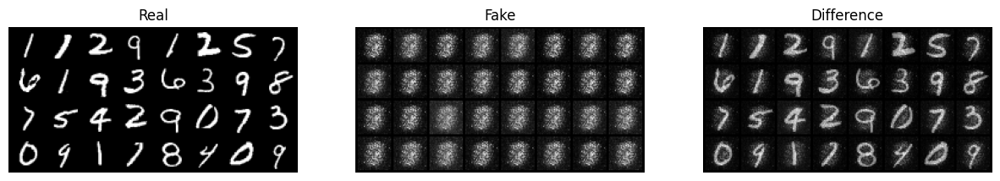

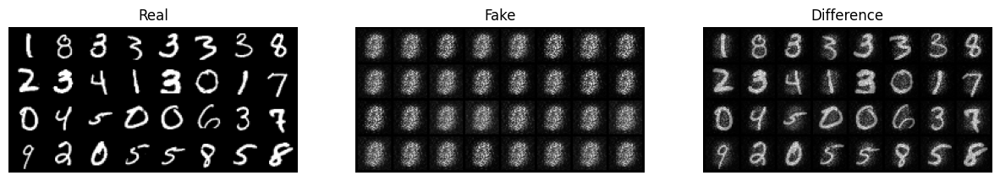

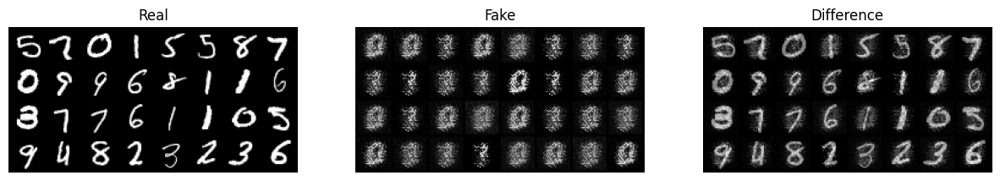

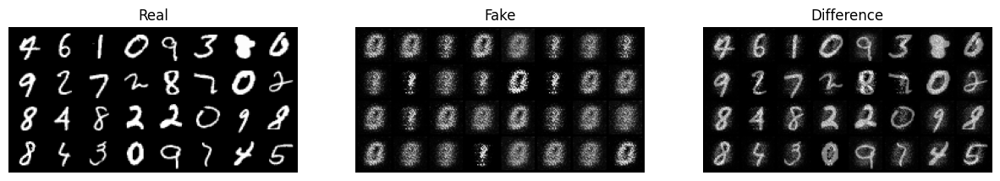

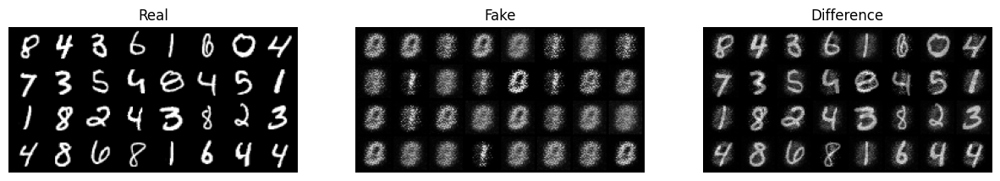

...

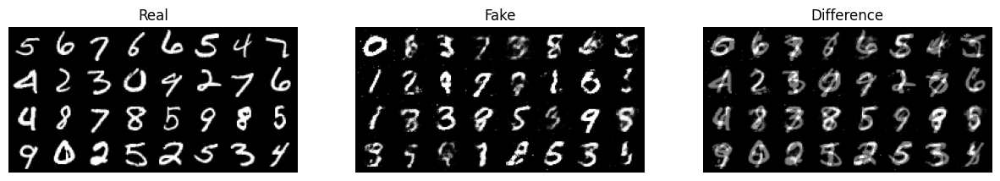

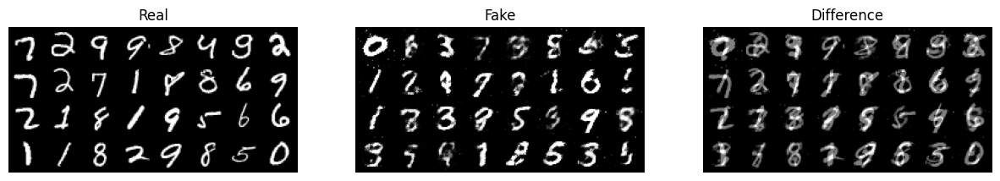

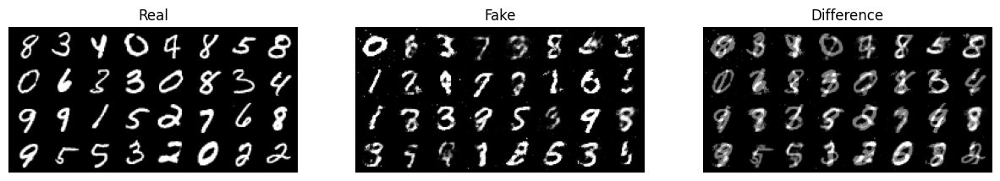

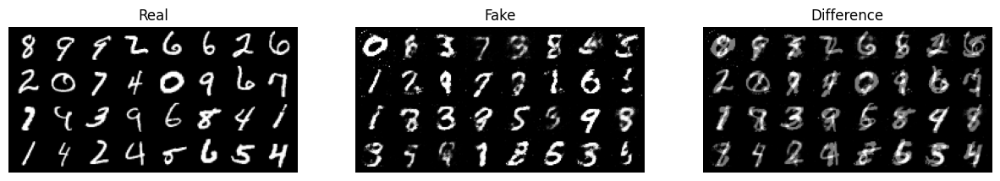

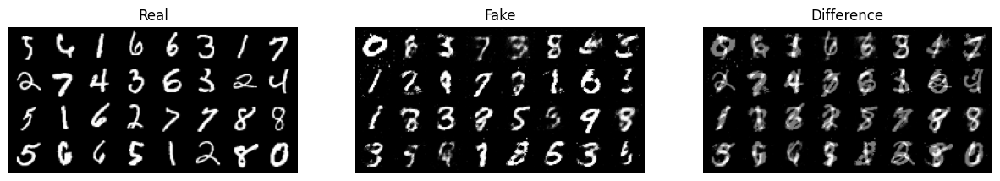

In [10]:
import os
from PIL import Image

# Directory containing generated images
image_dir = "/content/generated_images"

# Function to display difference between real and fake images for each iteration
def show_image_difference(real_images, fake_images):
    num_images = min(len(real_images), len(fake_images), 100)  # Limiting to a maximum of 100 images
    for i in range(num_images):
        real_img_path = os.path.join(image_dir, real_images[i])
        fake_img_path = os.path.join(image_dir, fake_images[i])

        real_img = Image.open(real_img_path)
        fake_img = Image.open(fake_img_path)

        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.axis("off")
        plt.imshow(real_img, cmap='gray')
        plt.title("Real")

        plt.subplot(1, 3, 2)
        plt.axis("off")
        plt.imshow(fake_img, cmap='gray')
        plt.title("Fake")

        plt.subplot(1, 3, 3)
        plt.axis("off")
        diff_img = Image.blend(real_img.convert('RGB'), fake_img.convert('RGB'), alpha=0.5)
        plt.imshow(diff_img)
        plt.title("Difference")

        plt.show()

# Load and display the images
fake_images = [f"fake_epoch_{i+1}.png" for i in range(len(os.listdir(image_dir)) // 2)]
real_images = [f"real_epoch_{i+1}.png" for i in range(len(os.listdir(image_dir)) // 2)]

show_image_difference(real_images, fake_images)
